### The Members of the group 6:

#### Eren Tümkaya 090190328<br>Konuralp Arslan 090190334<br>Ahmet Salih Coşkun 090190356

## Base Configurations

In [1]:
import pymongo
import pandas as pd
from pymongo import MongoClient
from random import random
import json

import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from collections import Counter
# Setting the aesthetics for the plots
sns.set(style="whitegrid")

In [2]:
client = MongoClient("mongodb://localhost:27017/")

In [3]:
db = client.COMP

## Ingesting the Data from MongoDB

In [4]:
collection_household = db['HOUSEHOLD']
collection_individual = db['INDIVIDUAL']

In [5]:
def get_DF(collection):
    cursor = collection.find({})
    data_list = list(cursor)
    df = pd.DataFrame(data_list)
    
    return df

In [6]:
df_individual = get_DF(collection_individual)
df_household = get_DF(collection_household)

In [7]:
df_individual.drop("_id",axis =1 ,inplace = True)
df_household.drop("_id",axis =1 ,inplace = True)

In [8]:
client.close()

## Exploratory Data Analysis

You can analyze following steps; 

* Identify Categorical and Numerical Columns
* Calculate Basic Statistics(mean, standard deviation, minimum, and maximum values)
* Examine Missing Data
* Examine Categoric and Numeric Variables
* Data Visualization
* Correlation Analysis
* Identifiying Outliers



## Initial Analysis for Household Data

Since this is the dataset which we will use as our core, we thought it would be better to start analysing this one first. As we shown in our previous step, this is a large dataset in terms of the features it has. We will be trying to find the best approaches to handle each of these columns. After reading the documentation carefully, we initilize our work.

### Duplicated Rows

In [9]:
df_household.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 49 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   hid           8000 non-null   object
 1   geo1          8000 non-null   object
 2   geo2          8000 non-null   object
 3   ea            8000 non-null   object
 4   urbrur        8000 non-null   object
 5   hhsize        8000 non-null   object
 6   statocc       8000 non-null   object
 7   rooms         8000 non-null   object
 8   bedrooms      8000 non-null   object
 9   floor         8000 non-null   object
 10  walls         8000 non-null   object
 11  roof          8000 non-null   object
 12  water         8000 non-null   object
 13  piped_water   8000 non-null   object
 14  toilet        8000 non-null   object
 15  flush_toilet  8000 non-null   object
 16  electricity   8000 non-null   object
 17  cook_fuel     8000 non-null   object
 18  phone         8000 non-null   object
 19  cell  

In [10]:
df_household[df_household.duplicated()]

,hid,geo1,geo2,ea,urbrur,hhsize,statocc,rooms,bedrooms,floor,...,exp_12,tot_exp,tot_food,share_food,pc_exp,quint_nat,quint_urb,quint_rur,hhweight,popweight


Since we don't have any problems with duplicates, we move on.

### Numerical Features

As we have been learning a lot in our classes, categorical and numerical columns are typically handled in different manners. Our dataset includes both of these types. We go on and start by identifying them. For this, we used the documetation provided to us. 

One thing to mention here, dataset features are ordered in a really nice way. Upon checking the documentation, we realised that 
after "exp_01" feature (including itself), every feature happens to be numeric till quint_nat, quint_urb and quint_rur(44th ,45th and 46th features, respectively). We seperated the dataframe accordingly.

*** We didn't use 47th and 48th features because they were not included in the data dictionary. 

In [11]:
df_household_num = df_household.iloc[:, [0] + list(range(28,44))].copy()

In [12]:
def convert_to_numeric_except_first(df):
    df_numeric = df.copy()
    
   
    for column_name in df.columns[1:]:
        df_numeric[column_name] = pd.to_numeric(df[column_name], errors='coerce')  
    return df_numeric

df_household_num = convert_to_numeric_except_first(df_household_num)

Our numeric columns look just fine. Let's check their data types before moving on.

In [13]:
df_household_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   hid         8000 non-null   object 
 1   exp_01      8000 non-null   int64  
 2   exp_02      8000 non-null   int64  
 3   exp_03      8000 non-null   int64  
 4   exp_04      8000 non-null   int64  
 5   exp_05      8000 non-null   int64  
 6   exp_06      8000 non-null   int64  
 7   exp_07      8000 non-null   int64  
 8   exp_08      8000 non-null   int64  
 9   exp_09      8000 non-null   int64  
 10  exp_10      8000 non-null   int64  
 11  exp_11      8000 non-null   int64  
 12  exp_12      8000 non-null   int64  
 13  tot_exp     8000 non-null   int64  
 14  tot_food    8000 non-null   int64  
 15  share_food  8000 non-null   float64
 16  pc_exp      8000 non-null   float64
dtypes: float64(2), int64(14), object(1)
memory usage: 1.0+ MB


All of them look okay. We will do the same for the categorical ones now.

### Categorical Features

In [14]:
df_household_cat=df_household.iloc[:, list(range(27)) + [44,45, 46]].copy()

In [15]:
df_household_cat.head()

,hid,geo1,geo2,ea,urbrur,hhsize,statocc,rooms,bedrooms,floor,...,car,bicycle,motorcycle,refrigerator,tv,radio,bank,quint_nat,quint_urb,quint_rur
0,00a191396a2,1,11,11066,2,1,1,1,1,2,...,0,0,0,1,1,0,0,5,4,
1,0111c7fa67c,1,11,11066,2,1,2,1,0,2,...,0,0,0,0,0,0,1,5,4,
2,01410d9c60d,1,11,11087,2,2,1,4,1,2,...,0,0,0,1,1,1,1,5,4,
3,015ff82b55c,1,11,11094,2,2,1,1,1,2,...,0,0,0,1,1,0,1,5,5,
4,01c39d3df0d,1,11,11094,2,1,2,3,2,6,...,1,0,0,1,1,0,1,5,5,


We will check their datatypes just like we did for the numeric ones.

In [16]:
df_household_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 30 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   hid           8000 non-null   object
 1   geo1          8000 non-null   object
 2   geo2          8000 non-null   object
 3   ea            8000 non-null   object
 4   urbrur        8000 non-null   object
 5   hhsize        8000 non-null   object
 6   statocc       8000 non-null   object
 7   rooms         8000 non-null   object
 8   bedrooms      8000 non-null   object
 9   floor         8000 non-null   object
 10  walls         8000 non-null   object
 11  roof          8000 non-null   object
 12  water         8000 non-null   object
 13  piped_water   8000 non-null   object
 14  toilet        8000 non-null   object
 15  flush_toilet  8000 non-null   object
 16  electricity   8000 non-null   object
 17  cook_fuel     8000 non-null   object
 18  phone         8000 non-null   object
 19  cell  

We will convert all these to categorical columns.

In [17]:
df_household_cat = df_household_cat.astype('category')

In [18]:
df_household_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 30 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   hid           8000 non-null   category
 1   geo1          8000 non-null   category
 2   geo2          8000 non-null   category
 3   ea            8000 non-null   category
 4   urbrur        8000 non-null   category
 5   hhsize        8000 non-null   category
 6   statocc       8000 non-null   category
 7   rooms         8000 non-null   category
 8   bedrooms      8000 non-null   category
 9   floor         8000 non-null   category
 10  walls         8000 non-null   category
 11  roof          8000 non-null   category
 12  water         8000 non-null   category
 13  piped_water   8000 non-null   category
 14  toilet        8000 non-null   category
 15  flush_toilet  8000 non-null   category
 16  electricity   8000 non-null   category
 17  cook_fuel     8000 non-null   category
 18  phone   

### Basic Statistics

For this part,  we will be checking the statistics info of our numeric variables to gain some insight. This will also be important on our outlier detection part. 

In [19]:
df_household_num.describe()

,exp_01,exp_02,exp_03,exp_04,exp_05,exp_06,exp_07,exp_08,exp_09,exp_10,exp_11,exp_12,tot_exp,tot_food,share_food,pc_exp
count,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,3774.062125,93.329250,663.703000,3083.725125,549.597500,288.231000,1167.769625,497.435875,330.275875,568.147375,354.233000,706.642250,12077.152000,3774.062125,0.364376,3665.114230
std,1742.040421,87.846963,446.776155,2328.139360,532.626896,238.622042,1441.885225,571.408457,363.674961,721.643406,309.593327,545.641374,7381.022408,1742.040421,0.166257,2863.957576
min,409.000000,0.000000,24.000000,121.000000,27.000000,13.000000,14.000000,0.000000,2.000000,0.000000,7.000000,10.000000,1421.000000,409.000000,0.079000,528.625000
25%,2611.000000,37.000000,335.000000,1228.500000,230.000000,117.000000,279.000000,85.000000,96.000000,92.000000,137.000000,273.000000,7044.000000,2611.000000,0.240000,1869.416656
50%,3508.500000,64.000000,587.000000,2651.500000,362.000000,216.000000,571.000000,312.000000,212.000000,313.000000,267.000000,636.000000,10308.000000,3508.500000,0.319000,2799.812500
75%,4664.000000,119.000000,868.000000,4184.000000,653.000000,384.000000,1400.250000,663.000000,425.000000,767.000000,471.000000,980.000000,14848.000000,4664.000000,0.480000,4519.625000
max,18397.000000,1084.000000,3755.000000,24552.000000,5139.000000,1968.000000,14035.000000,4545.000000,3984.000000,7410.000000,3274.000000,6765.000000,76247.000000,18397.000000,0.828000,34938.500000


### Outlier Handling

In [20]:
def remove_outliers_iqr_all_columns(df):
    df_no_outliers = df.copy()

    for column_name in df.columns[1:]:
        if pd.api.types.is_numeric_dtype(df[column_name]):
            # Calculate quartiles and IQR
            Q1 = df[column_name].quantile(0.1)
            Q3 = df[column_name].quantile(0.9)
            IQR = Q3 - Q1
            
            # Define the lower and upper bounds
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Remove outliers
            df_no_outliers = df_no_outliers[(df_no_outliers[column_name] >= lower_bound) & (df_no_outliers[column_name] <= upper_bound)]

    return df_no_outliers

In [21]:
df_household_num = remove_outliers_iqr_all_columns(df_household_num)

In [22]:
df_household_num.shape

(7714, 17)

We lost 286 values from outlier removal.

### Missing Data

We will be checking the missing data status for both our frames.

Let's start with the numeric one.

Before that, We want to show you something. While fetching the data from MongoDB, the NaN values are coming like this. It surprised us.

In [23]:
df_household["quint_urb"].value_counts()

     3550
5    1279
4     987
3     873
2     748
1     563
Name: quint_urb, dtype: int64

In [24]:
df_household[df_household["quint_urb"] == ""]

,hid,geo1,geo2,ea,urbrur,hhsize,statocc,rooms,bedrooms,floor,...,exp_12,tot_exp,tot_food,share_food,pc_exp,quint_nat,quint_urb,quint_rur,hhweight,popweight
1001,b4f4894e378,8,83,83092,1,5,1,2,1,1,...,749,7737,2305,0.2980000078678131,1547.4000244140625,2,,2,506.27557131998987,2531.377856599949
1002,b63e30c5431,8,83,83092,1,5,1,5,2,1,...,1306,18650,4497,0.2409999966621399,3730.0,4,,5,506.27557131998987,2531.377856599949
1003,b779e26decf,8,83,83092,1,3,1,3,2,2,...,243,13076,7463,0.5709999799728394,4358.66650390625,5,,5,506.27557131998987,1518.8267139599695
1005,ba99ce93d5f,8,83,83092,1,4,1,3,2,2,...,693,9984,3001,0.3009999990463257,2496.0,3,,4,506.27557131998987,2025.1022852799595
1006,bac52567744,8,83,83099,1,7,1,1,0,2,...,983,13387,5011,0.37400001287460327,1912.4285888671875,2,,3,409.8850266024829,2869.1951862173805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,e57647fc128,5,51,51017,1,4,1,3,2,2,...,603,10675,4704,0.4410000145435333,2668.75,3,,4,218.66888744307087,874.6755497722835
7996,e7f326fc7ec,5,51,51018,1,4,1,2,1,1,...,85,8991,6101,0.6790000200271606,2247.75,3,,4,355.3369420949902,1421.3477683799608
7997,ecb4aeea3b0,5,51,51017,1,4,1,2,2,2,...,690,9792,3356,0.34299999475479126,2448.0,3,,4,218.66888744307087,874.6755497722835
7998,ed7b98d01a7,5,51,51017,1,4,1,3,2,2,...,364,15367,7902,0.5139999985694885,3841.75,4,,5,218.66888744307087,874.6755497722835


After we examine that, We checked all columns by looking "" string value. That is what we did for data from MongoDB.

In [25]:
for col in df_household.columns:
    value = df_household[df_household[col]== ""]['hid'].count()
    print(f"in the {col}, There are {value} missing values.")

in the hid, There are 0 missing values.
in the geo1, There are 0 missing values.
in the geo2, There are 0 missing values.
in the ea, There are 0 missing values.
in the urbrur, There are 0 missing values.
in the hhsize, There are 0 missing values.
in the statocc, There are 0 missing values.
in the rooms, There are 0 missing values.
in the bedrooms, There are 0 missing values.
in the floor, There are 0 missing values.
in the walls, There are 0 missing values.
in the roof, There are 0 missing values.
in the water, There are 0 missing values.
in the piped_water, There are 0 missing values.
in the toilet, There are 0 missing values.
in the flush_toilet, There are 0 missing values.
in the electricity, There are 0 missing values.
in the cook_fuel, There are 0 missing values.
in the phone, There are 0 missing values.
in the cell, There are 0 missing values.
in the car, There are 0 missing values.
in the bicycle, There are 0 missing values.
in the motorcycle, There are 0 missing values.
in the 

In [26]:
df_household_num.isna().sum() / len(df_household_num) * 100

hid           0.0
exp_01        0.0
exp_02        0.0
exp_03        0.0
exp_04        0.0
exp_05        0.0
exp_06        0.0
exp_07        0.0
exp_08        0.0
exp_09        0.0
exp_10        0.0
exp_11        0.0
exp_12        0.0
tot_exp       0.0
tot_food      0.0
share_food    0.0
pc_exp        0.0
dtype: float64

This is really good to see. There are no missing data points in our numerical frame.

In [27]:
df_household_cat.isna().sum() / len(df_household_num) * 100

hid             0.0
geo1            0.0
geo2            0.0
ea              0.0
urbrur          0.0
hhsize          0.0
statocc         0.0
rooms           0.0
bedrooms        0.0
floor           0.0
walls           0.0
roof            0.0
water           0.0
piped_water     0.0
toilet          0.0
flush_toilet    0.0
electricity     0.0
cook_fuel       0.0
phone           0.0
cell            0.0
car             0.0
bicycle         0.0
motorcycle      0.0
refrigerator    0.0
tv              0.0
radio           0.0
bank            0.0
quint_nat       0.0
quint_urb       0.0
quint_rur       0.0
dtype: float64

Most of our categorical features don't have any missing data points.However, "quint_urb" and "quint_rur" columns have almost half of their values missing. We will decide what to do with them after our correlation analysis. 

### Numerical Data Correlation Analysis

Before checking the correlation as a number, we wanted to see our numerical features as pairplots. 

In [28]:
sns.pairplot(df_household_num);

There are some columns which are so correlated with each other. That is not known to be a good indicator for our model. For instance, exp-01 and tot-food columns look like they have a perfect linear relation. There are also others which seem like in a relation. We will also check with our correlation matrix to understand better.

<Axes: >

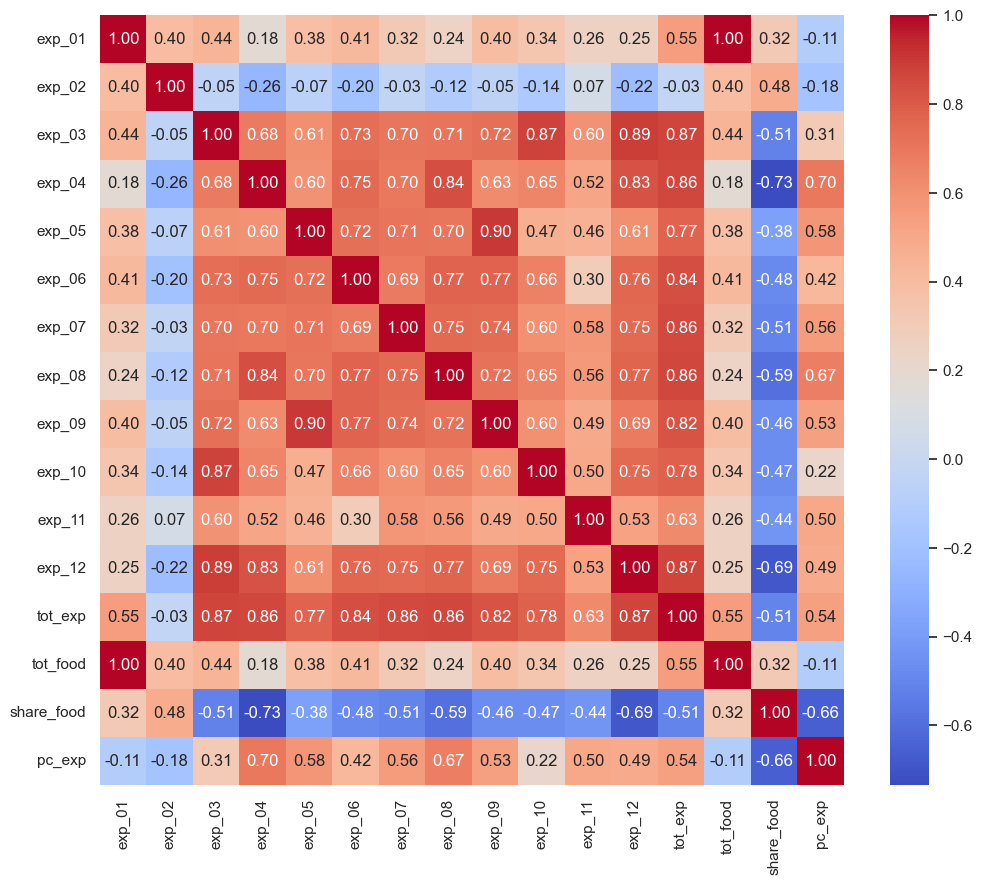

In [29]:
correlation_matrix = df_household_num.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

Just like we suspected, exp_01 and tot_food columns have a correlation which is set at "1". This is an indicator of perfect multicollinearity. We will drop one of them.  

Moreover, we realised that the tot_expenditure feature is highly correlated with other expenditures. We can basically say that the variability in that column can be explained by other expenditures. We will also drop that column. 

### Categorical Data Statistical Analysis

As we have also shown, we have lots of categorical features. We will select some of them and try to draw conclusions about our dataset. This part is both about curiosity and statistics.

For the categorical features, we wanted to perform some chi^2 contingency tests to dig deeper in our analysis. We will read the documentation carefully for this part.

#### Can we statistically back that there is a relation with having bank account and a landline phone?

In [30]:
ct = pd.crosstab(df_household_cat["bank"],df_household_cat["phone"])
print(ct)
chi2_contingency(ct,lambda_="log-likelihood")

phone     0     1
bank             
0      3206   197
1      2994  1603


Chi2ContingencyResult(statistic=1078.2769238941828, pvalue=1.739057985774843e-236, dof=1, expected_freq=array([[2637.325,  765.675],
       [3562.675, 1034.325]]))

This basically means that we can reject the null hyphothesis which there is no relation between them with a really high confidence level. P-value is extremely small in our case. 

#### Can we statistically back that there is a relation with having a cell phone and a car?

In [31]:
ct = pd.crosstab(df_household_cat["cell"],df_household_cat["car"])
print(ct)
chi2_contingency(ct,lambda_="log-likelihood")

car      0     1
cell            
0     2652   299
1     3387  1662


Chi2ContingencyResult(statistic=575.4475307706876, pvalue=3.6672635376598956e-127, dof=1, expected_freq=array([[2227.636125,  723.363875],
       [3811.363875, 1237.636125]]))

#### Can we statistically back that there is a relation with having electricty and the type of water supply?

In [32]:
ct = pd.crosstab(df_household_cat["piped_water"],df_household_cat["electricity"])
print(ct)
chi2_contingency(ct,lambda_="log-likelihood")

electricity     0     1
piped_water            
0            1104  2156
1             146  4306
2              30   124
3              72    62


Chi2ContingencyResult(statistic=1473.0990938742616, pvalue=0.0, dof=3, expected_freq=array([[ 550.94 , 2709.06 ],
       [ 752.388, 3699.612],
       [  26.026,  127.974],
       [  22.646,  111.354]]))

## Target Analysis

* Rural (1): There are 3550 instances classified as rural.
* Urban (2): There are 4450 instances classified as urban.



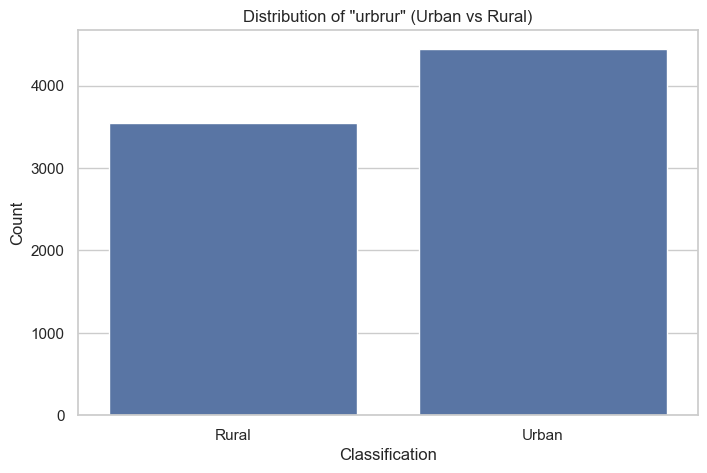

2    4450
1    3550
Name: urbrur, dtype: int64

In [33]:

urbrur_counts = df_household_cat['urbrur'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=urbrur_counts.index, y=urbrur_counts.values)
plt.title('Distribution of "urbrur" (Urban vs Rural)')
plt.xlabel('Classification')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Rural', 'Urban'])  
plt.show()

urbrur_counts

By looking at the classes, we see that we have a nice distribution of our two main columns. For classification tasks, it is important for our target classes to have a close distribution of their categories.

## Finding Relations between Our Target and Features

### Home Ownership and our Target (Urban or Rural)

Let's find out how is the "home ownership" compare depending on Rural and Urban areas.

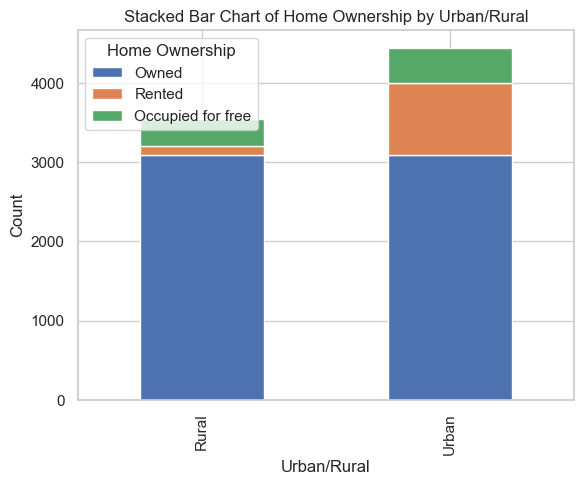

In [34]:
cross_tab_result = pd.crosstab(df_household_cat["statocc"].replace({"1":"Owned","2":"Rented","3":"Occupied for free"}), df_household_cat["urbrur"].replace({"1":"Rural","2":"Urban"})).T
cross_tab_result[["Owned", "Rented","Occupied for free"]]

gra = cross_tab_result.plot(kind='bar', stacked=True)
gra.set_xlabel("Urban/Rural")
gra.set_ylabel("Count")
gra.set_title("Stacked Bar Chart of Home Ownership by Urban/Rural")


gra.legend(title="Home Ownership")


plt.show()

Let's also see it in numbers.

Finally, let's look at the numbers from a statistical point of view once again.

In [35]:
ct = pd.crosstab(df_household_cat["statocc"].replace({"1":"Owned","2":"Rented","3":"Occupied for free"}),df_household_cat["urbrur"].replace({"1":"Rural","2":"Urban"}))
print(ct)
chi2_contingency(ct,lambda_="log-likelihood")

urbrur             Rural  Urban
statocc                        
Owned               3095   3092
Rented               111    910
Occupied for free    344    448


Chi2ContingencyResult(statistic=625.5500715377394, pvalue=1.457229278601687e-136, dof=2, expected_freq=array([[2745.48125, 3441.51875],
       [ 453.06875,  567.93125],
       [ 351.45   ,  440.55   ]]))

### Floor Materials in Urban/Rural Houses

Another feature which we were really curious about was the "floor material". We thought houses in rural areas and urban areas differ quite a lot in terms of materials used in their floor.

We wanted to see this in different piecharts. Let's check the rural one first. 

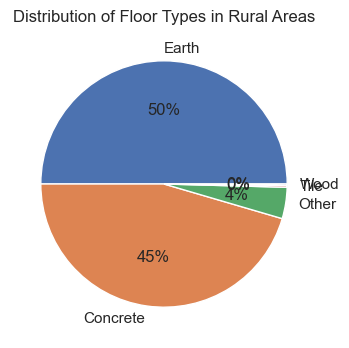

In [36]:
rural_floor_counts = Counter(df_household_cat[df_household_cat["urbrur"] == "1"]["floor"].replace({"1": "Earth", "2": "Concrete", "3": "Tile", "4": "Stone", "5": "Wood", "6": "Other"}))


plt.figure(figsize=(6, 4))
plt.pie(rural_floor_counts.values(), labels=rural_floor_counts.keys(), autopct='%.0f%%')


plt.title("Distribution of Floor Types in Rural Areas")


plt.show()

As we also also anticipated, "Earth" is a common option for rural areas.

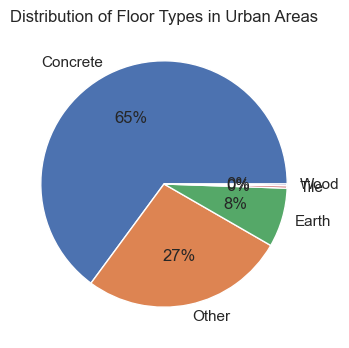

In [37]:
urban_floor_counts = Counter(df_household_cat[df_household_cat["urbrur"] == "2"]["floor"].replace({"1": "Earth", "2": "Concrete", "3": "Tile", "4": "Stone", "5": "Wood", "6": "Other"}))


plt.figure(figsize=(6, 4))
plt.pie(urban_floor_counts.values(), labels=urban_floor_counts.keys(), autopct='%.0f%%')


plt.title("Distribution of Floor Types in Urban Areas")


plt.show()

"Concrete" is 8 time more popular than the "Earth" material in Urban areas.

# Feature Extraction

We are expecting you to prepare new variables from the Individual dataset. You can combine these 2 datasets via 'hid' columns. First of all, the Individual dataset contains the characteristics of individuals within each family. After deduplicating(or aggregation) these features based on the 'hid' column, that is, after creating new variables, we expect you to add them to the Household dataset as new feature columns. Examples are given to you below. You may increase the number of features extracted.

Note: Since you will be generating new variables from Individual dataset, you can perform similar data exploratory analyzes within this dataset.

Please remember, it's important for us to to analyze and interpret new variables to understand dataset.

## EDA for Individual Dataset

In [38]:
df_individual.head()

,hid,idno,relation,sex,age,age_month,marstat,religion,school_attend,educ_attain,...,disability,blind,deaf,mental,ch_weight,ch_height,children_born,children_surv,births_12m,hhweight
0,98d3ad8605f,2,3,2,9,,1,6,1,1,...,0,0,0,0,,,,,,319.93674785227176
1,98d3ad8605f,3,3,2,13,,1,6,1,1,...,0,0,0,0,,,0,,0,319.93674785227176
2,99bc788b017,1,1,2,60,,4,6,4,1,...,0,0,0,0,,,1,1,,262.26314055442384
3,9a67378b077,1,1,1,64,,2,6,3,2,...,0,0,0,0,,,,,,338.7565565494642
4,9a67378b077,2,2,2,67,,2,6,3,2,...,0,0,0,0,,,3,3,0,338.7565565494642


In [39]:
df_individual.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32396 entries, 0 to 32395
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   hid             32396 non-null  object
 1   idno            32396 non-null  object
 2   relation        32396 non-null  object
 3   sex             32396 non-null  object
 4   age             32396 non-null  object
 5   age_month       32396 non-null  object
 6   marstat         32396 non-null  object
 7   religion        32396 non-null  object
 8   school_attend   32396 non-null  object
 9   educ_attain     32396 non-null  object
 10  yrs_school      32396 non-null  object
 11  literacy        32396 non-null  object
 12  act_status      32396 non-null  object
 13  labor_force     32396 non-null  object
 14  occupation      32396 non-null  object
 15  industry        32396 non-null  object
 16  migrate_recent  32396 non-null  object
 17  disability      32396 non-null  object
 18  blind 

In [40]:
for col in df_individual.columns:
    value = df_individual[df_individual[col]== ""]['hid'].count()
    print(f"in the {col}, There are {value} missing values.")

in the hid, There are 0 missing values.
in the idno, There are 0 missing values.
in the relation, There are 0 missing values.
in the sex, There are 0 missing values.
in the age, There are 0 missing values.
in the age_month, There are 29231 missing values.
in the marstat, There are 0 missing values.
in the religion, There are 0 missing values.
in the school_attend, There are 0 missing values.
in the educ_attain, There are 0 missing values.
in the yrs_school, There are 2542 missing values.
in the literacy, There are 0 missing values.
in the act_status, There are 0 missing values.
in the labor_force, There are 0 missing values.
in the occupation, There are 0 missing values.
in the industry, There are 0 missing values.
in the migrate_recent, There are 0 missing values.
in the disability, There are 0 missing values.
in the blind, There are 0 missing values.
in the deaf, There are 0 missing values.
in the mental, There are 0 missing values.
in the ch_weight, There are 29231 missing values.
i

In [41]:
df_individual = df_individual.apply(pd.to_numeric, errors='ignore')

* Average Age of Household Members (Ortalama Hanehalkı Yaşı): The mean age of individuals within each household.
* Average Educational Attainment (Ortalama Eğitim Seviyesi): The mean educational attainment level of household members.
* Number of Individuals with Disabilities (Engelli Birey Sayısı): The count of household members with disabilities.
* Average Births in Last 12 Months (Son 12 Ayda Ortalama Doğum Sayısı): The mean number of births in the last 12 months per household.
* Household Religious Diversity (Hanehalkı Dini Çeşitliliği): A measure of the diversity of religious affiliations within each household.

In [42]:
df_individual.describe()

,idno,relation,sex,age,age_month,marstat,religion,school_attend,educ_attain,yrs_school,...,disability,blind,deaf,mental,ch_weight,ch_height,children_born,children_surv,births_12m,hhweight
count,32396.000000,32396.000000,32396.000000,32396.000000,3165.000000,32396.000000,32396.000000,32396.000000,32396.000000,29854.000000,...,32396.000000,32396.000000,32396.000000,32396.000000,3165.000000,3165.000000,11623.000000,7715.000000,11320.000000,32396.000000
mean,3.087511,2.474225,1.505309,28.136190,30.359558,1.591987,5.772565,2.404741,1.460828,4.637134,...,0.039110,0.026238,0.008767,0.007810,11.933210,86.185972,2.293728,3.114712,0.047968,310.975034
std,2.047521,1.029515,0.499980,20.137273,17.293287,0.721442,1.063478,1.151001,0.892722,4.942147,...,0.193859,0.159844,0.093220,0.088028,2.898169,12.650298,2.669148,2.194210,0.214534,70.741693
min,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,4.770000,48.400000,0.000000,0.000000,0.000000,156.667553
25%,2.000000,2.000000,1.000000,12.000000,15.000000,1.000000,6.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,9.760000,77.700000,0.000000,1.000000,0.000000,264.084412
50%,3.000000,3.000000,2.000000,24.000000,31.000000,1.000000,6.000000,3.000000,1.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,12.340000,89.500000,2.000000,2.000000,0.000000,302.684327
75%,4.000000,3.000000,2.000000,42.000000,45.000000,2.000000,6.000000,3.000000,2.000000,8.000000,...,0.000000,0.000000,0.000000,0.000000,14.380000,96.400000,3.000000,4.000000,0.000000,350.174292
max,22.000000,5.000000,2.000000,100.000000,59.000000,4.000000,7.000000,4.000000,4.000000,18.000000,...,1.000000,1.000000,1.000000,1.000000,18.590000,108.800000,18.000000,15.000000,2.000000,552.230851


#### Disability and Labor force?

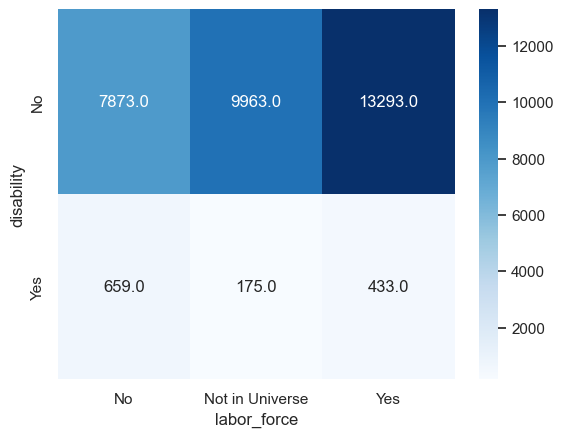

In [43]:
ct = pd.crosstab(df_individual["disability"].replace({0:"No",1:"Yes"}),
                 df_individual["labor_force"].replace({0:"Not in Universe",1:"Yes",2:"No"}))
sns.heatmap(ct,annot=True,fmt=".1f",cmap="Blues");

#### Relation and Literacy

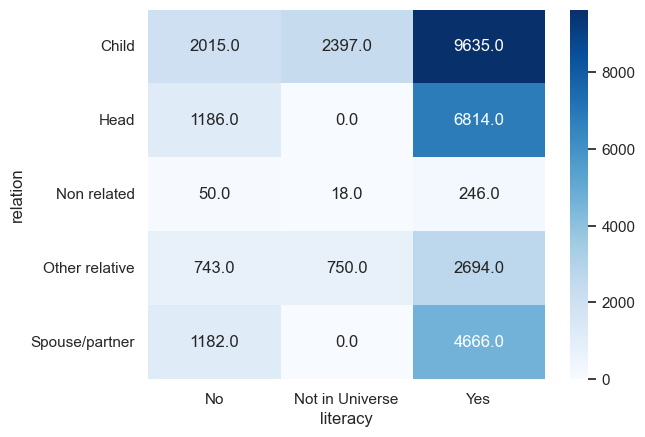

In [44]:
ct = pd.crosstab(df_individual["relation"].replace({1:"Head",2:"Spouse/partner",3:"Child",4:"Other relative",5:"Non related"}),
                 df_individual["literacy"].replace({0:"Not in Universe",1:"Yes",2:"No"}))
sns.heatmap(ct,annot=True,fmt=".1f",cmap="Blues");

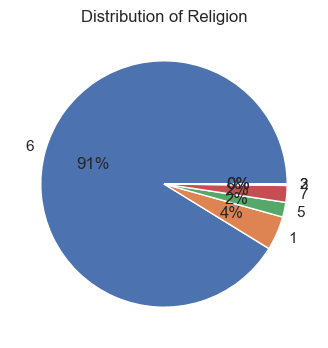

In [45]:
plt.figure(figsize=(6, 4))
plt.pie(Counter(df_individual["religion"]).values(), labels=Counter(df_individual["religion"]).keys(), autopct='%.0f%%')

plt.title("Distribution of Religion")

plt.show()

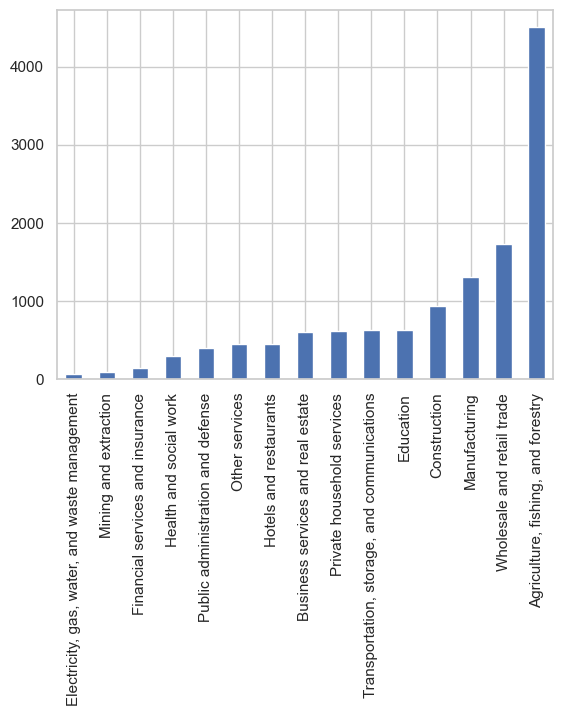

In [46]:
df_individual.industry.replace({0 : "NIU (not in universe)",
                                1 : "Agriculture, fishing, and forestry",
                                2 : "Mining and extraction",
                                3 : "Manufacturing",
                                4 : "Electricity, gas, water, and waste management",
                                5 : "Construction",
                                6 : "Wholesale and retail trade",
                                7 : "Hotels and restaurants",
                                8 : "Transportation, storage, and communications",
                                9 : "Financial services and insurance",
                                10 : "Public administration and defense",
                                11 : "Business services and real estate",
                                12 : "Education",
                                13 : "Health and social work",
                                14 : "Other services",
                                15 : "Private household services",
                                16 : "Other industry, n.e.c."
                               }).value_counts().iloc[1:].sort_values().plot(kind='bar');

## Creating New Features

We created 2 new features which names are 'Number of People' and 'Distant Relative' in addition to features given to us.

We decided to add such a feature (Distant Relative) because we thought that families living in rural areas live with their distant relatives more than those living in the city. For calculation, we define the function in the below and added the data 'Distant Relative' column.

In [47]:
def assign_label(group):
    if 4 in group['relation'].values:
        group['relation'] = "Distant Relation"
    else:
        group['relation'] = "Normal Relation"
    return group

In [48]:
# Aggregating data to create new variables at the household level

# Grouping by 'hid'
grouped_data = df_individual.groupby('hid')

# Creating the new variables
new_variables = {
    'Average Age': grouped_data['age'].mean(),
    'Average Education Level': grouped_data['educ_attain'].mean(),
    'Number of Disabled Individuals': grouped_data['disability'].sum(),
#    'Average Births Last 12 Months': grouped_data['births_12m'].mean(),
    'Religious Diversity': grouped_data['religion'].nunique(),
    'Number of People':grouped_data['idno'].count(),
    'Distant Relative':grouped_data.apply(assign_label)[['hid','relation']].groupby('hid').first()['relation'],
    
}

# Converting the new variables into a DataFrame
new_variables_df = pd.DataFrame(new_variables)

# Displaying the first few rows of the new variables
new_variables_df.reset_index(inplace = True)
new_variables_df

,hid,Average Age,Average Education Level,Number of Disabled Individuals,Religious Diversity,Number of People,Distant Relative
0,00076fe9d44,19.000000,0.800000,1,1,5,Normal Relation
1,001732acf20,50.000000,0.000000,0,1,1,Normal Relation
2,0025c7eb6b0,27.000000,2.333333,0,1,3,Normal Relation
3,0025c83c02c,18.250000,0.750000,0,1,4,Normal Relation
4,002a356ac9f,24.800000,1.600000,1,1,5,Normal Relation
...,...,...,...,...,...,...,...
7995,ffdf35cd744,22.333333,0.666667,0,1,3,Normal Relation
7996,ffdfe160ab5,32.888889,1.000000,0,1,9,Distant Relation
7997,ffe1892f851,15.875000,1.375000,0,1,8,Normal Relation
7998,fff47529494,16.000000,1.500000,0,1,4,Distant Relation


We also added 'Family Size' column. Because we thought that people, living in rural areas, live with more people.

We seperated the 3 different categories we defined.

In [49]:
conditions = [
    new_variables_df['Number of People'].isin(range(1,4)),
    new_variables_df['Number of People'].isin(range(4,7)),
    new_variables_df['Number of People'].isin(range(7,30))
]

values = ['Small', 'Medium', 'Large']

new_variables_df['Family Size'] = np.select(conditions, values)

new_variables_df.drop("Number of People",axis=1,inplace=True)

In [50]:
household = pd.merge(df_household_cat, df_household_num, on = 'hid', how = 'inner')

In [51]:
model_data = pd.merge(household, new_variables_df, on = 'hid', how = 'inner')
model_data

,hid,geo1,geo2,ea,urbrur,hhsize,statocc,rooms,bedrooms,floor,...,tot_exp,tot_food,share_food,pc_exp,Average Age,Average Education Level,Number of Disabled Individuals,Religious Diversity,Distant Relative,Family Size
0,00a191396a2,1,11,11066,2,1,1,1,1,2,...,5044,1279,0.254,5044.00,31.00,3.00,0,1,Normal Relation,Small
1,0111c7fa67c,1,11,11066,2,1,2,1,0,2,...,4652,1755,0.377,4652.00,54.00,1.00,0,1,Normal Relation,Small
2,01410d9c60d,1,11,11087,2,2,1,4,1,2,...,9957,1722,0.173,4978.50,43.50,2.00,0,1,Distant Relation,Small
3,015ff82b55c,1,11,11094,2,2,1,1,1,2,...,11533,3700,0.321,5766.50,50.00,1.00,0,2,Normal Relation,Small
4,01c39d3df0d,1,11,11094,2,1,2,3,2,6,...,14549,1492,0.103,14549.00,41.00,3.00,0,1,Normal Relation,Small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7709,e57647fc128,5,51,51017,1,4,1,3,2,2,...,10675,4704,0.441,2668.75,38.75,1.25,0,1,Normal Relation,Medium
7710,e7f326fc7ec,5,51,51018,1,4,1,2,1,1,...,8991,6101,0.679,2247.75,25.50,1.00,0,1,Normal Relation,Medium
7711,ecb4aeea3b0,5,51,51017,1,4,1,2,2,2,...,9792,3356,0.343,2448.00,25.25,1.75,0,1,Normal Relation,Medium
7712,ed7b98d01a7,5,51,51017,1,4,1,3,2,2,...,15367,7902,0.514,3841.75,30.00,1.75,0,1,Normal Relation,Medium


In [52]:
ct = pd.crosstab(model_data["Family Size"],model_data["urbrur"].replace({"1":"Rural","2":"Urban"}))
print(ct)
chi2_contingency(ct,lambda_="log-likelihood")

urbrur       Rural  Urban
Family Size              
Large          539    348
Medium        1621   1848
Small         1328   2030


Chi2ContingencyResult(statistic=133.44774271305522, pvalue=1.0524242792698394e-29, dof=2, expected_freq=array([[ 401.07026186,  485.92973814],
       [1568.56002074, 1900.43997926],
       [1518.3697174 , 1839.6302826 ]]))

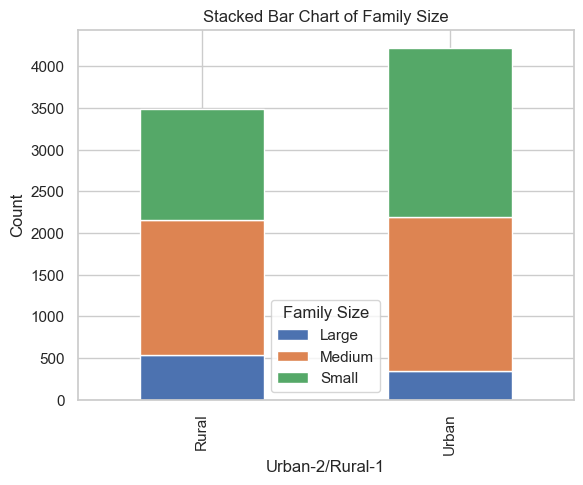

In [53]:
gra = ct.T.plot(kind='bar', stacked=True)
gra.set_xlabel("Urban-2/Rural-1")
gra.set_ylabel("Count")
gra.set_title("Stacked Bar Chart of Family Size")

gra.legend(title="Family Size")

plt.show()

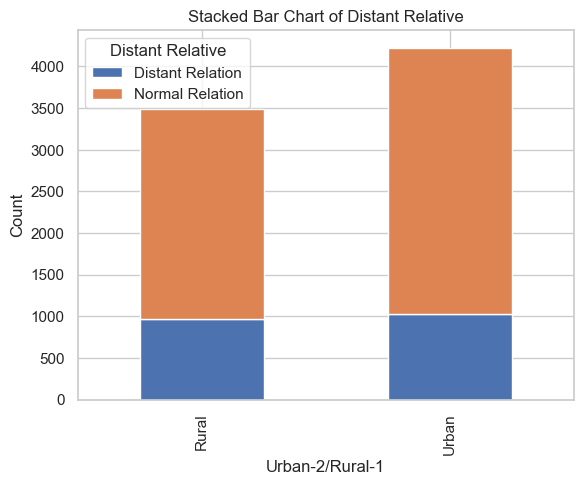

In [54]:
ct = pd.crosstab(model_data["Distant Relative"],model_data["urbrur"].replace({"1":"Rural","2":"Urban"}))

gra = ct.T.plot(kind='bar', stacked=True)
gra.set_xlabel("Urban-2/Rural-1")
gra.set_ylabel("Count")
gra.set_title("Stacked Bar Chart of Distant Relative")

gra.legend(title="Distant Relative")

plt.show()

## Modeling & Model Performances

Data Preprocessing Steps; 
 * Remove ID and Geo Columns 
 * Handle missing values etc.
 * Handle categoric variables etc.
 * Handle numeric variables etc.
 * Split Train/Test (70/30)
 
Model Selection
 * Since it's a classification problem you can use several classification algorithms such as  Random Forest, and Gradient Boosting etc. And compare their performances.
 
Model Training and Evaluation
 * Train each model on the training set. Evaluate their performance using metrics like accuracy, precision, recall, and F1-score. Create a confusion matrix for each model.



Please remember, it's important for us to add your comments about each model performances.

### 1) Modeling

In [55]:
# Change target column definitian for a binary classification problems

# 1=Rural ,  Urban=2

model_data['urbrur'] = model_data['urbrur'].replace({2:0 , 1:1})

In [56]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [57]:
data = model_data.copy()

# Removing the ID and geo columns 
# Since quint_rur and quint_urb columns are too correlated with our target we did also remove these features
data.drop(['hid','geo1','geo2', 'quint_rur','quint_urb'], axis=1, inplace=True) 


# High correlated columns are removed
data.drop(['tot_exp','tot_food','ea'], axis=1, inplace=True) 

# Splitting the dataset into features (X) and target variable (y)
X = data.drop('urbrur', axis=1)
y = data['urbrur']

X = pd.get_dummies(X, dummy_na=False)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

### 2) Model Performances

Confusion Matrix is a tool used to evaluate the performance of the algorithm in classification problems. This matrix shows the relationship between actual and predicted classes.

It basically consists of four terms:

True Positive (TP): True positives - Data points whose true value is positive and which the algorithm correctly predicts as positive.

True Negative (TN): True negatives - Data points whose true value is negative and which the algorithm correctly predicts as negative.

False Positive (FP): False positives – Data points that are actually negative but the algorithm predicts positive (also known as Type I error).

False Negative (FN): False negatives – Data points that are actually positive but the algorithm predicts as negative (also known as Type II error).


Precision is the ratio of the model's correct positive predictions to the total positive predictions. Higher sensitivity means fewer false positive predictions.

Recall measures how much of the events that should have been predicted as positive were actually predicted as positive.

The F1 score is used to achieve a balance between precision and recall. F1 score is the harmonic mean of precision and sensitivity. If both sensitivity and sensitivity are high, the F1 score will be high.

Support: Shows the number of examples of each class in the actual data set.

Accuracy: It refers to the ratio of the model's correct predictions to the total data.

Macro Avg and Weighted Avg: These values provide the average precision, recall and f1-score values under different weights. While macro avg takes the equally weighted average of all classes, weighted avg calculates the weighted average of the classes according to the number of samples.

 ### 2.1) Model 1

In [58]:
# Training the Model1 Classifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Create a Random Forest classifier
model1 = RandomForestClassifier(n_estimators=100, random_state=30)

# Train the model
model1.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model1.predict(X_test)

# Evaluate the model
accuracy1 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy1:.2f}")

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.88

Classification Report:
              precision    recall  f1-score   support

           1       0.88      0.85      0.86      1047
           2       0.88      0.90      0.89      1268

    accuracy                           0.88      2315
   macro avg       0.88      0.88      0.88      2315
weighted avg       0.88      0.88      0.88      2315



Model Score: 0.8794816414686825


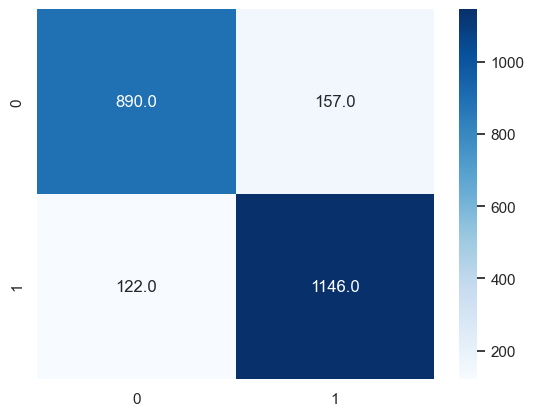

In [59]:
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay

print("Model Score:",model1.score(X_test,y_test))
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt=".1f",cmap="Blues");

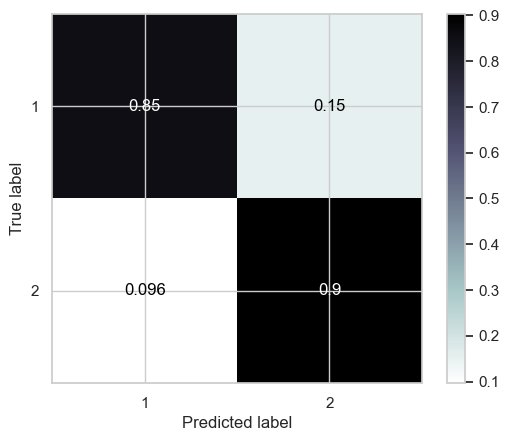

In [60]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, normalize='true', cmap='bone_r');

In [61]:
df_features = pd.DataFrame(model1.feature_importances_, columns = ['Importance'],
             index = X_train.columns).sort_values('Importance', ascending = False).reset_index()
df_features.rename(columns = {'index':'Variable'}, inplace = True)
df_features.head(10)

,Variable,Importance
0,share_food,0.077176
1,exp_04,0.047321
2,cook_fuel_4,0.041674
3,exp_12,0.041135
4,exp_08,0.041071
5,toilet_11,0.040971
6,cook_fuel_2,0.040947
7,exp_06,0.035300
8,exp_09,0.028896
9,bank_1,0.026566


 ### 2.2) Model 2

In [62]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report

# Create a Gradient Boosting classifier
model2 = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)

# Train the model
model2.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model2.predict(X_test)

# Evaluate the model
accuracy2 = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy2:.2f}")

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.89

Classification Report:
              precision    recall  f1-score   support

           1       0.89      0.85      0.87      1047
           2       0.88      0.92      0.90      1268

    accuracy                           0.89      2315
   macro avg       0.89      0.89      0.89      2315
weighted avg       0.89      0.89      0.89      2315



Model Score: 0.8881209503239741


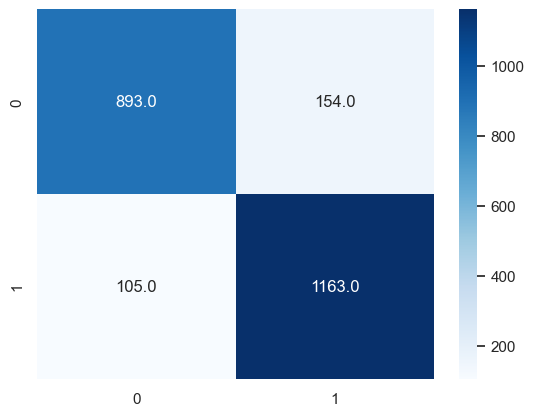

In [63]:
print("Model Score:",model2.score(X_test,y_test))
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt=".1f",cmap="Blues");

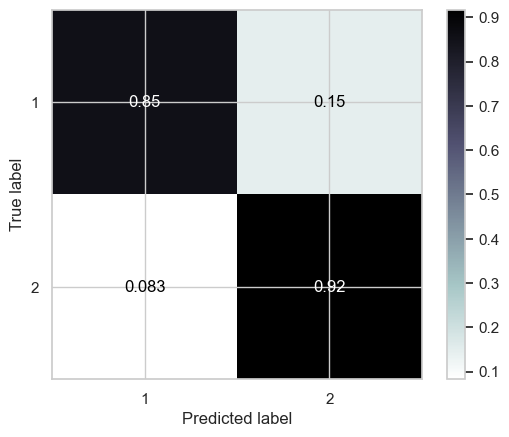

In [64]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, normalize='true', cmap='bone_r');

In [65]:
df_features = pd.DataFrame(model2.feature_importances_, columns = ['Importance'],
             index = X_train.columns).sort_values('Importance', ascending = False).reset_index()
df_features.rename(columns = {'index':'Variable'}, inplace = True)
df_features.head(10)

,Variable,Importance
0,share_food,0.401465
1,cook_fuel_2,0.106187
2,toilet_11,0.073037
3,exp_06,0.045870
4,statocc_2,0.044180
5,exp_07,0.040759
6,exp_09,0.036083
7,exp_08,0.031338
8,piped_water_0,0.031284
9,exp_11,0.024207


First of all, we think that both of our models give good results, but when we consider metrics such as accuracy, precision, recall, F1, we can say that our 2nd model gives better results with a small difference.

Additionally, when we compare the 2 models, we see that the results of Rural, which we represent with 2, are better. We think that the reason for this is that there is more data belonging to rural class.

## Save Model

In [66]:
model = model1 if accuracy1 > accuracy2 else model2

In [67]:
model_file = 'finalized_model.pickle'
pickle.dump(model, open(model_file, 'wb')) # model is your final model object.

variable_file = 'model_variables.pickle'
pickle.dump(df_features, open(variable_file, 'wb')) # df_features is dataframe that holds final model variables.

In [68]:
# Write your test predictions to Mongo DB

In [69]:
model.predict(X_test)

array(['1', '1', '2', ..., '2', '1', '1'], dtype=object)

In [70]:
# Make predictions on the test data
predictions = model.predict(X_test)

# Connect to MongoDB
client = MongoClient("mongodb://localhost:27017/")
db = client.COMP
collection = db['PREDICTIONS']

# Create a DataFrame with the test predictions and relevant information
df_predictions = pd.DataFrame({
    'Prediction': predictions,
})

# Convert the DataFrame to a list of dictionaries for easy insertion into MongoDB
predictions_data = df_predictions.to_dict(orient='records')

# Insert the predictions data into MongoDB
collection.insert_many(predictions_data)

# Check the collections data into MongoDB
print(db.list_collection_names())

# Close the MongoDB connection
client.close()

['PREDICTIONS', 'INDIVIDUAL', 'HOUSEHOLD']
